# Sydney AirBnB - Listings data
* 1. Exploratory Data Analysis
* 2. Mapping AirBnB listings weighting based on price
* 3. Listing vs Price relationship eg. Attractions, Transport, Median Income, Demographic, Amenities
* 4. Overlay Census Data
* 5. Write Medium article explaining findings and methodology

### References:
* https://towardsdatascience.com/geopandas-101-plot-any-data-with-a-latitude-and-longitude-on-a-map-98e01944b972

In [50]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
import folium
from folium.plugins import HeatMap
import numpy as np

In [101]:
pd.set_option('display.max_columns', None)
%matplotlib inline

In [102]:
data = pd.read_csv("data/listings_dec18.csv")

/Users/janetyuen/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (43,61,62,87) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [103]:
# For simplicity removed columns with null values
columns = ['id', 'host_id','neighbourhood','latitude', 'longitude', 'room_type','accommodates', 'bathrooms','bedrooms',\
           'beds', 'price', 'minimum_nights','number_of_reviews', 'calculated_host_listings_count', 'availability_365']
           
data = data[columns]

## Data Pre-Processing

In [104]:
# Drop NA values
data.dropna(inplace=True)
# Convert price into numeric
data['price'] = data['price'].apply(lambda x: x.replace('$', ''))
data['price'] = data['price'].apply(lambda x: x.replace(',', ''))
data['price'] = pd.to_numeric(data['price'])
# Change Neighbourhood string to Upper case so can join with NSW Shape file
data['neighbourhood'] = data.neighbourhood.apply(lambda x: x.upper())

In [105]:
data['count'] = 1
data_locations = data.groupby(['latitude','longitude'])['count'].agg('sum').reset_index().values.tolist()
data_price = data.groupby(['latitude','longitude'])['price'].agg('mean').reset_index()

In [106]:
# Create a blank map
m = folium.Map(location=[-33.8708, 151.2073], tiles='OpenStreetMap', zoom_start=15)
#1. Heatmap based on number of listings
HeatMap(data=data_price, radius=8, max_zoom=13).add_to(m)

Difficult to see distribution in house prices using Folium heat map. We will need to pre-process the data further to get a better understanding of AirBnB prices in different regions. One map is a *cloropleth map*.
**Choropleth_map** is a thematic map in which areas are shaded or patterned in proportion to the measurement of the statistical variable being displayed on the map, such as population density, per-capita income or in our case AirBnB per night price

In [107]:
# Dependencies
# Shape file based on Postcode
nsw_shp = "data/NSW_LOCALITY_POLYGON_shp.shp"
map_df = gpd.read_file(nsw_shp)
# check the GeoDataframe
map_df.head()

,LC_PLY_PID,DT_CREATE,DT_RETIRE,LOC_PID,NSW_LOCALI,NSW_LOCA_1,NSW_LOCA_2,NSW_LOCA_3,NSW_LOCA_4,NSW_LOCA_5,NSW_LOCA_6,NSW_LOCA_7,geometry
0,25065,2015-09-03,None,NSW2557,2015-11-10,None,MAYFIELD WEST,None,None,G,None,1,"POLYGON ((151.73345 -32.87974, 151.73286 -32.8..."
1,16193,2011-11-22,None,NSW4136,2012-02-04,None,WALLACETOWN,None,None,G,None,1,"POLYGON ((147.45092 -34.96519, 147.45639 -34.9..."
2,19660,2012-11-21,None,NSW4098,2013-01-23,None,UTUNGUN,None,None,G,None,1,"POLYGON ((152.80591 -30.71097, 152.81237 -30.7..."
3,25101,2015-09-03,None,NSW4391,2015-11-10,None,WOLLSTONECRAFT,None,None,G,None,1,"POLYGON ((151.19808 -33.82566, 151.19816 -33.8..."
4,19669,2012-11-21,None,NSW3304,2013-01-23,None,PUTNEY,None,None,G,None,1,"POLYGON ((151.10398 -33.81987, 151.10406 -33.8..."


In [141]:
base_df = data.merge(map_df, left_on='neighbourhood', right_on='NSW_LOCA_2',how='inner')
base_df.columns

Index(['id', 'host_id', 'neighbourhood', 'latitude', 'longitude', 'room_type',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price',
       'minimum_nights', 'number_of_reviews', 'calculated_host_listings_count',
       'availability_365', 'count', 'LC_PLY_PID', 'DT_CREATE', 'DT_RETIRE',
       'LOC_PID', 'NSW_LOCALI', 'NSW_LOCA_1', 'NSW_LOCA_2', 'NSW_LOCA_3',
       'NSW_LOCA_4', 'NSW_LOCA_5', 'NSW_LOCA_6', 'NSW_LOCA_7', 'geometry'],
      dtype='object')

In [189]:
import urllib, json

In [190]:
#Open and read in json file from URL
URL = 'https://data.gov.au/geoserver/nsw-suburb-locality-boundaries-psma-administrative-boundaries/wfs?request=GetFeature&typeName=ckan_91e70237_d9d1_4719_a82f_e71b811154c6&outputFormat=json'
response = urllib.urlopen(url)
data = json.loads(response.read())

AttributeError: module 'urllib' has no attribute 'urlopen'

In [142]:
m = folium.Map(location=[-33.8708, 151.2073], tiles='OpenStreetMap', zoom_start=15)
folium.Choropleth(
    geo_data=URL,
    data=base_df,
    columns=['NSW_LOCA_2', 'count'],
    key_on='feature.properties.nsw_loca_2',
    fill_color='YlGnBu', 
    fill_opacity=1, 
    line_opacity=1,
    legend_name='Births per 1000 inhabitants',
    highlight=True,
    smooth_factor=0).add_to(m)
m

In [183]:
len(test['features'])

319

## Exploratory Data Analysis
* Countplot: Minimum_nights, Price, room_type, instant_bookable
* Kdeplot: price
* Scatter plot: Bedrooms vs Price, Accommodates vs Price

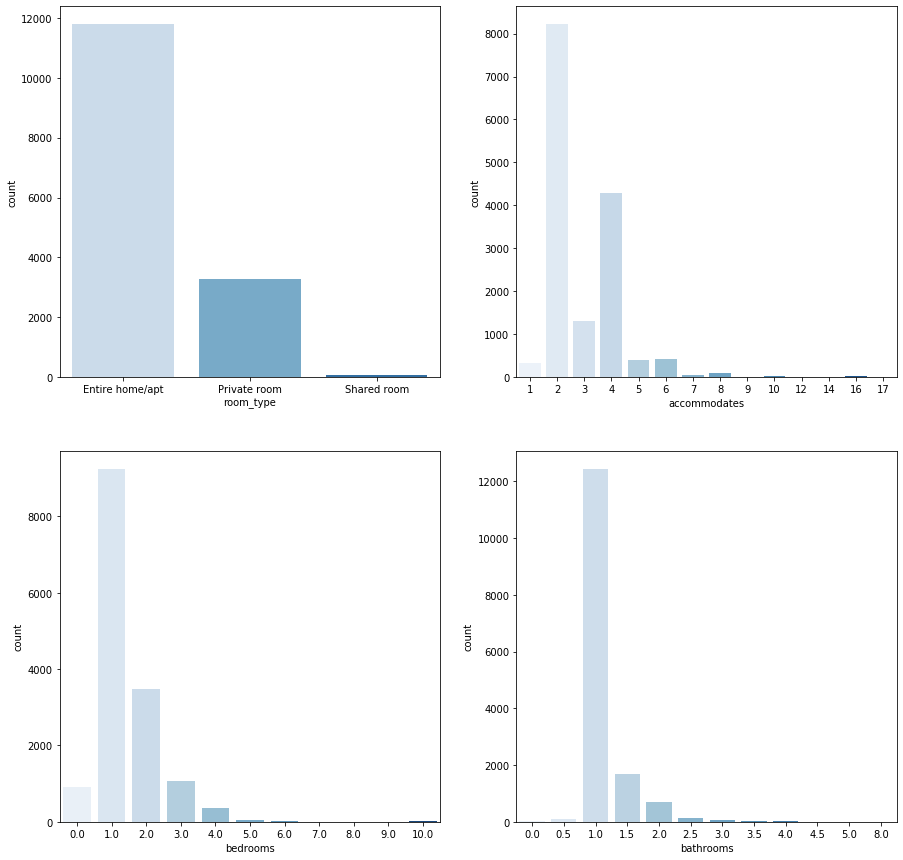

In [7]:
fig, axes = plt.subplots(2,2, figsize=(15,15))
sns.countplot(data=data_df, x='room_type',ax=axes[0][0],palette='Blues')
sns.countplot(data=data_df, x='accommodates',ax=axes[0][1],palette='Blues')
sns.countplot(data=data_df, x='bedrooms',ax=axes[1][0],palette='Blues')
sns.countplot(data=data_df, x='bathrooms',ax=axes[1][1],palette='Blues')

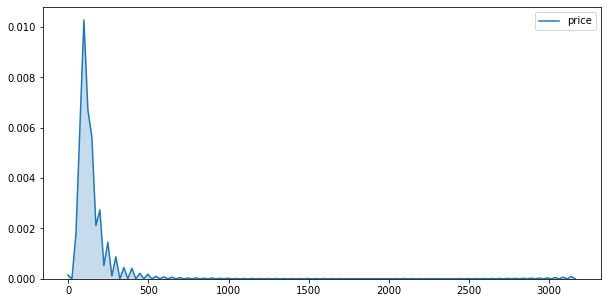

In [8]:
plt.figure(figsize=(10,5))
sns.kdeplot(data_df['price'],shade=True)

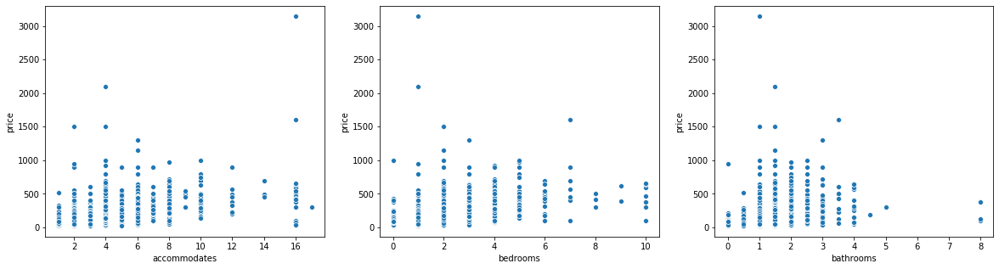

In [9]:
fig, axes = plt.subplots(1,3,figsize=(20,5))
sns.scatterplot(x='accommodates', y='price', data=data_df, ax=axes[0])
sns.scatterplot(x='bedrooms', y='price', data=data_df,ax=axes[1])
sns.scatterplot(x='bathrooms', y='price', data=data_df,ax=axes[2])

In [2]:
data.head()

NameError: name 'data' is not defined